# Table of Content

1. Preparation
    - 1.1 Import 
    - 1.2 Resources
    - 1.3 Load Data
2. Explore Numerical Columns
    - 2.1 Collect numeric variables
    - 2.2 Correlation Matrix
    - 2.3 Highest Correlation
3. Derive New Measures
4. Explore Categorical Variables
    - 4.1 Helper function
    - 4.2 - 4.5 review_score Analysis

This Notebook analyses the relationships of variables within the data set.

# 1 Preparation

# 1.1 Imports

In [40]:
import sys
from pathlib import Path

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
#import plotly.express as px

sys.path.insert(0, r"C:\Users\vynde\PycharmProjects\dataanalysis")
import databridger as da

# 1.2 Resources

In [2]:
    raw_data_folder = Path('..') / 'data' / 'raw'
    report_folder = Path('..') / 'reports'

# 1.3 Load Data

Load database with databriger

In [3]:
db_csv = da.Database(raw_data_folder)

Convert datetime variables

In [4]:
for key in db_csv.tables:
    for column in db_csv.tables[key].columns:
        if db_csv.tables[key][column].dtype == 'object':
            if all(db_csv.tables[key][column].str.match(r"\d{4}-\d{2}-\d{2} \d{2}:\d{2}:\d{2}")):
                db_csv.tables[key][column] = pd.to_datetime(db_csv.tables[key][column])
                print(f"converted:   {key:15} / {column:30} from object to {db_csv.tables[key][column].dtype}")

converted:   olist_orders_dataset / order_purchase_timestamp       from object to datetime64[ns]
converted:   olist_orders_dataset / order_approved_at              from object to datetime64[ns]
converted:   olist_orders_dataset / order_delivered_carrier_date   from object to datetime64[ns]
converted:   olist_orders_dataset / order_delivered_customer_date  from object to datetime64[ns]
converted:   olist_orders_dataset / order_estimated_delivery_date  from object to datetime64[ns]
converted:   olist_order_items_dataset / shipping_limit_date            from object to datetime64[ns]
converted:   olist_order_reviews_dataset / review_creation_date           from object to datetime64[ns]
converted:   olist_order_reviews_dataset / review_answer_timestamp        from object to datetime64[ns]


Rename tables

In [5]:
table_names = list(db_csv.tables.keys())

# remove 'olist_' and '_dataset' in table_names
new_table_names = (
    list(map(
        lambda x: x.removeprefix("olist_").removesuffix("_dataset"), 
        table_names
    ))
)

# overwrite table names in db_csv
db_csv.tables = dict(zip(new_table_names, db_csv.tables.values()))

Overview

In [6]:
db_csv.update_columns_mapping(["geolocation_zip_code_prefix"])
db_csv.info

,table,column,count,unique_count,duplicated_count,missing_values,type,subtype,mode,mode_count,min_date,max_date,range,min,max,mean
0,customers,customer_id,99441,99441,0,0,key,primary,NaN,NaN,NaT,NaT,NaT,NaN,NaN,NaN
1,customers,customer_unique_id,99441,96096,3345,0,key,unknown,NaN,NaN,NaT,NaT,NaT,NaN,NaN,NaN
2,customers,customer_zip_code_prefix,99441,14994,84447,0,key,foreign,NaN,NaN,NaT,NaT,NaT,NaN,NaN,NaN
3,customers,customer_city,99441,4119,95322,0,spatial,region,NaN,NaN,NaT,NaT,NaT,NaN,NaN,NaN
4,customers,customer_state,99441,27,99414,0,spatial,region,NaN,NaN,NaT,NaT,NaT,NaN,NaN,NaN
5,geolocation,geolocation_zip_code_prefix,1000163,19015,981148,0,key,primary,NaN,NaN,NaT,NaT,NaT,NaN,NaN,NaN
6,geolocation,geolocation_lat,1000163,717360,282803,0,spatial,coordinates,NaN,NaN,NaT,NaT,NaT,NaN,NaN,NaN
7,geolocation,geolocation_lng,1000163,717613,282550,0,spatial,coordinates,NaN,NaN,NaT,NaT,NaT,NaN,NaN,NaN
8,geolocation,geolocation_city,1000163,8011,992152,0,spatial,coordinates,NaN,NaN,NaT,NaT,NaT,NaN,NaN,NaN
9,geolocation,geolocation_state,1000163,27,1000136,0,spatial,coordinates,NaN,NaN,NaT,NaT,NaT,NaN,NaN,NaN


Column and table mappings need to be corrected. Current implementation of the Database class for csv files does not construct a compatible columns_mapping for using its easy_merge method.

Therefore, table-column-pairs just need to be swapped and concatenated

In [7]:
# original mapping
df1 = db_csv.columns_mapping[["from_table", "from_column", "to_table", "to_column"]]
# swapped version
df2 = db_csv.columns_mapping[["to_table", "to_column", "from_table", "from_column"]]

# Renaming columns to match the df1's columns
df2.columns = ["from_table", "from_column", "to_table", "to_column"]

# new mapping
adjusted_columns_mapping = pd.concat([df1, df2], ignore_index=True).drop_duplicates()

# apply the new mapping to the Database instance
db_csv.columns_mapping = adjusted_columns_mapping

# this is copy/pasted from the Database class directly
db_csv.table_mapping = dict(db_csv.columns_mapping[["from_table", "to_table"]].groupby("from_table")["to_table"].apply(list))

# 2 Explore Numerical Relationships

## 2.1 Collect Numerical Variables

In [8]:
numeric_info = db_csv.info.query("type=='numeric'").dropna(axis=1)
numeric_info

,table,column,count,unique_count,duplicated_count,missing_values,type,subtype,min,max,mean
23,order_items,price,112650,5968,106682,0,numeric,continuous,0.85,6735.00,120.653739
24,order_items,freight_value,112650,6999,105651,0,numeric,continuous,0.00,409.68,19.990320
26,order_payments,payment_sequential,103886,29,103857,0,numeric,discrete,1.00,29.00,1.092679
28,order_payments,payment_installments,103886,24,103862,0,numeric,discrete,0.00,24.00,2.853349
29,order_payments,payment_value,103886,29077,74809,0,numeric,continuous,0.00,13664.08,154.100380
32,order_reviews,review_score,99224,5,99219,0,numeric,discrete,1.00,5.00,4.086421
39,products,product_name_lenght,32951,66,32884,610,numeric,discrete,5.00,76.00,48.476949
40,products,product_description_lenght,32951,2960,29990,610,numeric,discrete,4.00,3992.00,771.495285
41,products,product_photos_qty,32951,19,32931,610,numeric,discrete,1.00,20.00,2.188986
42,products,product_weight_g,32951,2204,30746,2,numeric,discrete,0.00,40425.00,2276.472488


Construct dict of tables with column lists to leverage the easy_merge method of db_csv

In [9]:
columns_to_merge = numeric_info[["table", "column"]].groupby("table")["column"].apply(list).to_dict()
columns_to_merge

{'order_items': ['price', 'freight_value'],
 'order_payments': ['payment_sequential',
  'payment_installments',
  'payment_value'],
 'order_reviews': ['review_score'],
 'products': ['product_name_lenght',
  'product_description_lenght',
  'product_photos_qty',
  'product_weight_g',
  'product_length_cm',
  'product_height_cm',
  'product_width_cm']}

In [10]:
db_csv_numeric = db_csv.easy_merge(columns_to_merge)
db_csv_numeric

order_items shape: (112650, 7)
orders shape: (99441, 8) --> MERGED shape: (112650, 15)
order_payments shape: (103886, 5) --> MERGED shape: (117601, 20)
order_reviews shape: (99224, 7) --> MERGED shape: (117329, 27)
products shape: (32951, 9) --> MERGED shape: (117329, 36)


,order_items_price,order_items_freight_value,order_payments_payment_sequential,order_payments_payment_installments,order_payments_payment_value,order_reviews_review_score,products_product_name_lenght,products_product_description_lenght,products_product_photos_qty,products_product_weight_g,products_product_length_cm,products_product_height_cm,products_product_width_cm
0,58.9,13.29,1,2,72.19,5,58.0,598.0,4.0,650.0,28.0,9.0,14.0
1,55.9,17.96,1,1,73.86,5,58.0,598.0,4.0,650.0,28.0,9.0,14.0
2,64.9,18.33,1,2,83.23,4,58.0,598.0,4.0,650.0,28.0,9.0,14.0
3,58.9,16.17,1,3,75.07,5,58.0,598.0,4.0,650.0,28.0,9.0,14.0
4,58.9,13.29,1,4,72.19,5,58.0,598.0,4.0,650.0,28.0,9.0,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
117324,129.9,51.20,1,1,181.10,5,37.0,653.0,1.0,6700.0,35.0,12.0,22.0
117325,99.0,13.52,1,2,112.52,4,30.0,308.0,1.0,2300.0,37.0,30.0,20.0
117326,736.0,20.91,1,1,756.91,5,33.0,658.0,3.0,400.0,19.0,9.0,15.0
117327,229.9,44.02,1,7,273.92,4,32.0,280.0,2.0,2700.0,60.0,15.0,15.0


## 2.2 Correlation Matrix

In [11]:
corr = db_csv_numeric.corr()
corr

,order_items_price,order_items_freight_value,order_payments_payment_sequential,order_payments_payment_installments,order_payments_payment_value,order_reviews_review_score,products_product_name_lenght,products_product_description_lenght,products_product_photos_qty,products_product_weight_g,products_product_length_cm,products_product_height_cm,products_product_width_cm
order_items_price,1.000000,0.414014,0.006717,0.279000,0.741433,-0.004515,0.017853,0.201950,0.052378,0.340712,0.145386,0.225115,0.172667
order_items_freight_value,0.414014,1.000000,0.021956,0.185774,0.374270,-0.037076,0.022442,0.096853,0.021786,0.611302,0.309137,0.394332,0.324993
order_payments_payment_sequential,0.006717,0.021956,1.000000,-0.086130,-0.064475,-0.004634,-0.005528,0.009945,-0.010705,0.044021,0.049023,0.024671,0.030868
order_payments_payment_installments,0.279000,0.185774,-0.086130,1.000000,0.274334,-0.042279,0.020717,0.036342,-0.000699,0.177936,0.117074,0.122614,0.138328
order_payments_payment_value,0.741433,0.374270,-0.064475,0.274334,1.000000,-0.082404,0.003298,0.156257,0.009833,0.305458,0.139966,0.216773,0.148374
order_reviews_review_score,-0.004515,-0.037076,-0.004634,-0.042279,-0.082404,1.000000,-0.006323,0.010354,0.022266,-0.028641,-0.020441,-0.026409,-0.010743
products_product_name_lenght,0.017853,0.022442,-0.005528,0.020717,0.003298,-0.006323,1.000000,0.089872,0.145183,0.021031,0.058800,-0.030353,0.062877
products_product_description_lenght,0.201950,0.096853,0.009945,0.036342,0.156257,0.010354,0.089872,1.000000,0.117374,0.064236,0.007836,0.073896,-0.068087
products_product_photos_qty,0.052378,0.021786,-0.010705,-0.000699,0.009833,0.022266,0.145183,0.117374,1.000000,0.021121,0.044444,-0.034560,0.006269
products_product_weight_g,0.340712,0.611302,0.044021,0.177936,0.305458,-0.028641,0.021031,0.064236,0.021121,1.000000,0.462499,0.582490,0.506340


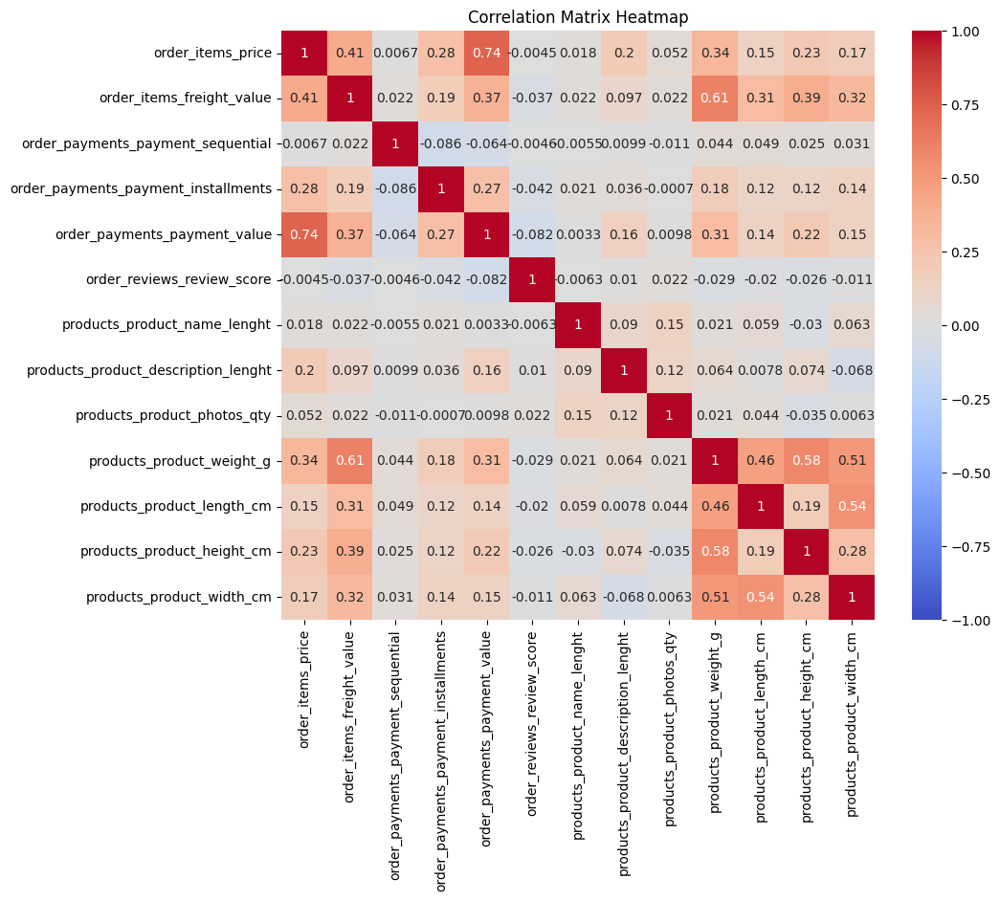

In [12]:
# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)

plt.title('Correlation Matrix Heatmap')
plt.show()

**Correlation Matrix Explanationm**

1. **Coefficient Range**: The correlation coefficient can range from -1 to 1.
- A value closer to 1 implies a strong positive correlation: as one variable increases, the other also tends to increase.
- A value closer to -1 implies a strong negative correlation: as one variable increases, the other tends to decrease.
- A value closer to 0 implies little to no linear relationship between the variables.
2. **Interpretation**:
- 0: no relationship
- 0.1–0.3: weak relationship
- 0.3–0.5: moderate relationship
- 0.5–1.0: strong relationship
3. **Discussion Based on Provided Matrix**:
- **price vs payment_value (0.74)**: This correlation is intuitive. Note that a payment can be part of a larger payment for the complete order and price ist just the price of one product of an order. 
- **freight_value vs product_weight_g (0.61)**: There is a strong positive correlation between freight value and product weight. This suggests that as the weight of the product increases, the freight value or shipping cost also tends to increase.
- **payment_installments vs payment_value**: The moderate linear relationship indicates that, as the total value of an order increases, customers are more likely to opt for more installment payments.
- **product_description_length vs price (0.2)**: Not pretty high, but the weak correlation could infer that sellers may invest more time on the description of pricier products.
- **product measurements**: Most of the product measurements (weight and size dimensions) have a moderate to strong correlation which also is intuitive.
4. **Close to Zero Correlations**
- **review_score**: None of the measures correlate with the review score. Intermediate measures may be introduced to find correlations.
- **product_name_length**: No correlation expected at all.
- **product_photos_qty**: Contrary to the investment in detailed product descriptions, the effort to provide multiple photos doesn't necessarily correlate with an item's value. This might be because visuals are often seen as essential for online shopping, without regard to the product's price, while extensive descriptions could be more typical for pricier or complex items.
5. **Significance**: While the heatmap provides an intuitive view of the relationships, it's essential to consider the context. Just because two variables have a strong correlation doesn't necessarily mean one causes the other. Moreover, for statistical significance, further tests might be needed, especially with a large number of features.

In summary, the heatmap provides a quick and visual represen

## 2.3 Highest Correlation / Scatterplot

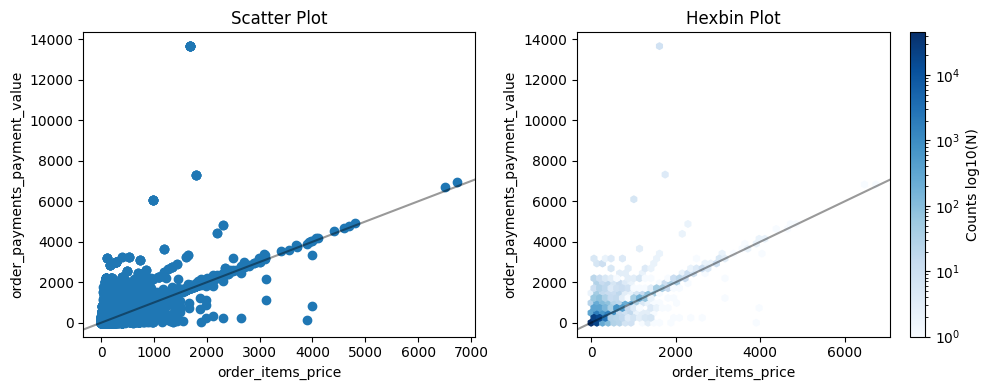

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Get correlation matrix
corr_matrix = db_csv_numeric.corr()

# Mask the main diagonal
np.fill_diagonal(corr_matrix.values, np.nan)

# Find the pair with the highest correlation
column_name, row_name = np.where(corr_matrix == np.nanmax(corr_matrix.values))
column_name = db_csv_numeric.columns[column_name[0]]
row_name = db_csv_numeric.columns[row_name[0]]

# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), tight_layout=True)

ax1.scatter(db_csv_numeric[column_name], db_csv_numeric[row_name])
ax1.set_title("Scatter Plot")

hb = ax2.hexbin(db_csv_numeric["order_items_price"], db_csv_numeric["order_payments_payment_value"], gridsize=50, cmap='Blues', bins='log')
plt.colorbar(hb, label='Counts log10(N)')
ax2.set_title("Hexbin Plot")

for ax in (ax1, ax2):
    xlim, ylim = ax.get_xlim(), ax.get_ylim()
    ax.plot(ylim, ylim, color="k", alpha=0.4)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    
    ax.set_xlabel(column_name)
    ax.set_ylabel(row_name)


The scatterplot between `payment_value` and `order_items`shows that some observations are near the main diagonale, meaning that the price is equal to the payment_value. For prices below 2000 however, the points are more scatterd ranging to both extrema, near zero price and near zero payment_value. This is due to the fact, that each observation belongs to an order with 1 or many products. Let's explain these 3 zones:
1. **Main diagonale**:
- price == payment_value
- Only 1 item in an order
- Order is paid directly in one payment.
2. Observations **near zero price**: Low priced product belonging to an order with other products
3. Observations **near zero payment**: Payment was not done at once

The high correlation infers that most observations are around the main diagonale, which, however, could be better seen in a heatmap.

## 2.4 Pairplot

For the pair plots, the geolocation table is excluded because it's so large, as well as the key columns which doesn't make sense in a pair plot.

In [18]:
# all columns except the geolocation table and key columns
columns_to_merge = db_csv.info.query("(table!='geolocation') and (type!='key')")[["table", "column"]].groupby("table")["column"].apply(list).to_dict()
columns_to_merge

{'customers': ['customer_city', 'customer_state'],
 'order_items': ['shipping_limit_date', 'price', 'freight_value'],
 'order_payments': ['payment_sequential',
  'payment_type',
  'payment_installments',
  'payment_value'],
 'order_reviews': ['review_score',
  'review_comment_title',
  'review_comment_message',
  'review_creation_date',
  'review_answer_timestamp'],
 'orders': ['order_status',
  'order_purchase_timestamp',
  'order_approved_at',
  'order_delivered_carrier_date',
  'order_delivered_customer_date',
  'order_estimated_delivery_date'],
 'products': ['product_name_lenght',
  'product_description_lenght',
  'product_photos_qty',
  'product_weight_g',
  'product_length_cm',
  'product_height_cm',
  'product_width_cm'],
 'sellers': ['seller_city', 'seller_state']}

In [20]:
# merge everything
db_csv_merged = db_csv.easy_merge(columns_to_merge)

customers shape: (99441, 5)
orders shape: (99441, 8) --> MERGED shape: (99441, 13)
order_items shape: (112650, 7) --> MERGED shape: (112650, 20)
order_payments shape: (103886, 5) --> MERGED shape: (117601, 25)
order_reviews shape: (99224, 7) --> MERGED shape: (117329, 32)
products shape: (32951, 9) --> MERGED shape: (117329, 41)
sellers shape: (3095, 4) --> MERGED shape: (117329, 45)


Pairplot using hue = `order_reviews_review_score`

c:\Users\vynde\.virtualenvs\brazilian-ecommerce-olist\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


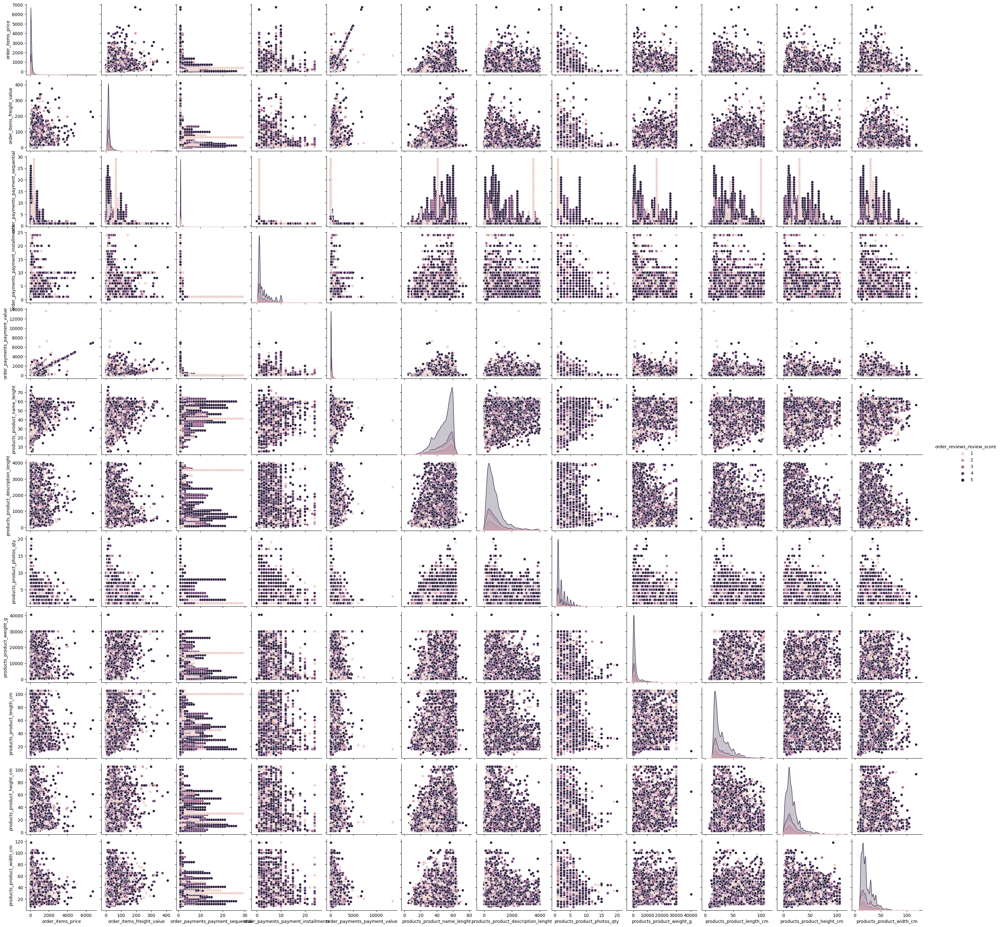

In [22]:
sns.pairplot(db_csv_merged, hue="order_reviews_review_score")

Dividing the pairplot by review_scores using different hues did not contribute to getting deeper insights.

Pairplot using hue = `order_payments_payment_type`

c:\Users\vynde\.virtualenvs\brazilian-ecommerce-olist\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


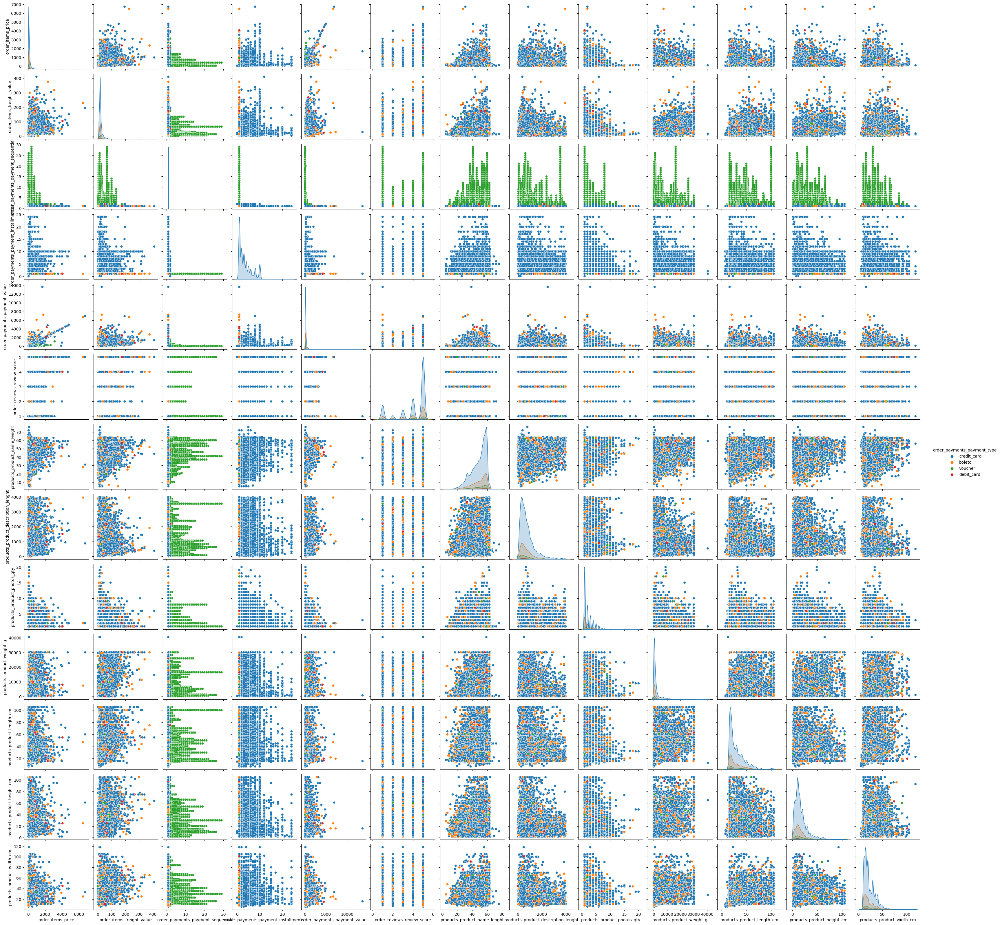

In [23]:
sns.pairplot(db_csv_merged, hue="order_payments_payment_type")

Recap the distribution of the variable currently used as hue.

<Axes: ylabel='order_payments_payment_type'>

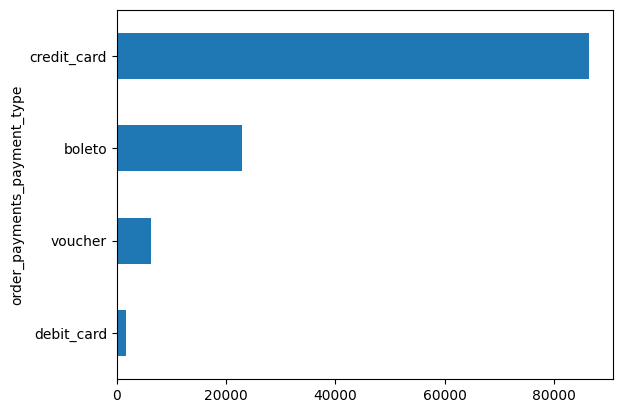

In [24]:
db_csv_merged["order_payments_payment_type"].value_counts()[::-1].plot.barh()

Note that the subplots on the pairplots are plotted in reverse order as shown in the legend. That means all blue points, which stand for credit_card and are the most of all points, are in the foreground. This means we only see other payment_types where there are no credit_card type payments. This is important to know when interpreting the results, because the plots are very crowded. 

Comments on distributions:
- Some variables have a wide range but the distribution shows that alomost all values are in a much smaller range
    - **price**
    - **freight_value**
    - **payments_sequential** (no credit_card used for higher number of payments)
    - payment_value
    - product_weight_g
- other variables have a high density at lower values which constantly decreses to almost 0
    - payment_installments
    - description_length
    - product_photos_qty
    - product_length_cm
    - product_height_cm
    - product_width_cm
- one variable has the same distribution flipped (starting at 0, highest density at maximum values)
    - product_name_length
- one variable distribution starts at medium density then falls before it increases to its maximum
    - **review_score**

variables marked **bold** for further investigation.

c:\Users\vynde\.virtualenvs\brazilian-ecommerce-olist\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


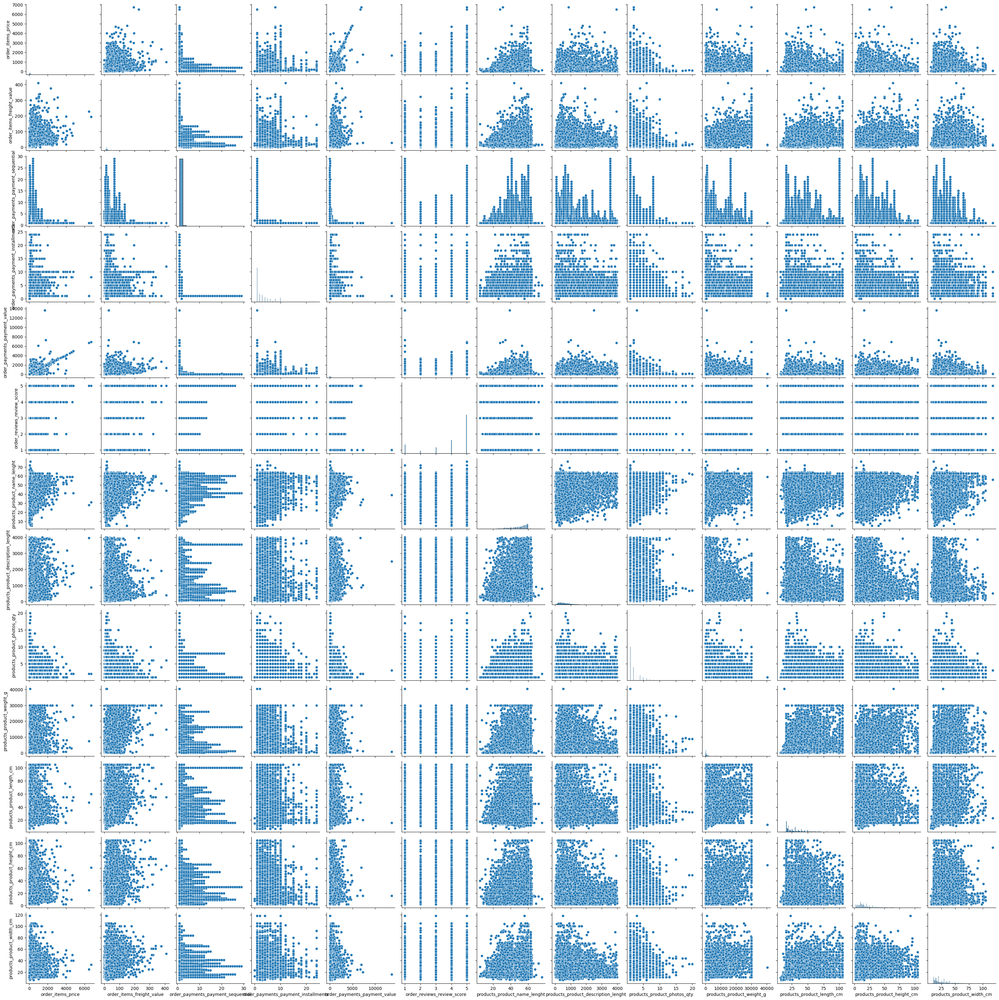

In [26]:
sns.pairplot(db_csv_numeric)

# 3 Derive New Measures

In [43]:
table_names = ["orders", "order_items", "order_payments", "order_reviews", "products"]
tables = [db_csv.tables[table_name] for table_name in table_names]

for table in tables:
    print(table.shape, table.columns.tolist())

df = tables[0]
for table in tables[1:]:
    df = df.merge(table, how="outer")

print(df.shape)

(99441, 8) ['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date', 'order_estimated_delivery_date']
(112650, 7) ['order_id', 'order_item_id', 'product_id', 'seller_id', 'shipping_limit_date', 'price', 'freight_value']
(103886, 5) ['order_id', 'payment_sequential', 'payment_type', 'payment_installments', 'payment_value']
(99224, 7) ['review_id', 'order_id', 'review_score', 'review_comment_title', 'review_comment_message', 'review_creation_date', 'review_answer_timestamp']
(32951, 9) ['product_id', 'product_category_name', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm']
(119143, 32)


Need to be careful because `order_item_id` and `payment_sequential` are internal ids

In [44]:
# track count if internal ids per order
df["order_numitems"] = df.groupby("order_id")["order_item_id"].transform("max")
df["order_numpayments"] = df.groupby("order_id")["payment_sequential"].transform("max")

# products
df["total_products_sold"] = df.groupby(["product_id", "order_item_id", "payment_sequential"]).transform("size")
da.wrangle.create_flag(df, col="total_products_sold", flag_col="total_products_sold_cat", 
    limits=[10, 200, 400], labels=["rarely_sold", "commonly_sold", "frequently_sold", "top_seller"])
df["avg_products_price"] = df.groupby(["product_id", "order_item_id", "payment_sequential"])["price"].transform("mean")
da.wrangle.create_flag(df, col="avg_products_price", flag_col="avg_products_price_cat", 
    limits=[1, 100, 1000], labels=["cheap", "low_priced", "high_priced", "expensive"])

# payment
df["order_payment"] = df.groupby(["order_id", "order_item_id"])["payment_value"].transform("sum")

# order items
df["order_price"] = df.groupby(["order_id", "payment_sequential"])["price"].transform("sum")
df["order_freight"] = df.groupby(["order_id", "payment_sequential"])["freight_value"].transform("sum")

# orders
df["time_to_approve"] = df["order_approved_at"] - df["order_purchase_timestamp"]
df["time_to_carrier"] = df["order_delivered_carrier_date"] - df["order_purchase_timestamp"]
df["time_to_customer"] = (df["order_delivered_customer_date"] - df["order_purchase_timestamp"]).dt.days
da.wrangle.create_flag(df, col="time_to_customer", flag_col="time_to_customer_cat", 
    limits=[1, 10, 30], labels=["max1day", "max10days", "max30days", "upto209"])
df["time_to_customer_est"] = df["order_estimated_delivery_date"] - df["order_purchase_timestamp"]

# 4 Explore Categorical Variables

Focused on review_score

## 4.1 Helper function to define colors from a colormap

In [38]:
def get_colors(cmap, count, ascending=True):
    min = 0.3
    max = 0.99
    if count >= 2:
        vals = np.linspace(min, max, count)
    else:
        vals = [max]
    
    if not ascending:
        vals = vals[::-1]
    
    return [cmap(val) for val in vals]


## 4.2 review_score vs delivery lead time

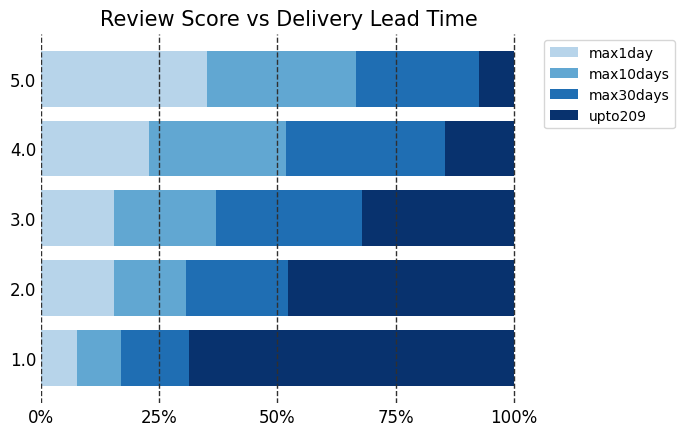

In [53]:
da.plot.bar100(
    df, 
    x="time_to_customer_cat", 
    xorder=["max1day", "max10days", "max30days", "upto209"],
    y="review_score", 
    yorder=[1,2,3,4,5],
    title="Review Score vs Delivery Lead Time\n",
    bar_dict=dict(color=get_colors(cm.Blues, 4)))

The delivery lead time seems to be a crucial factor for customers.

## 4.3 review_score vs product price

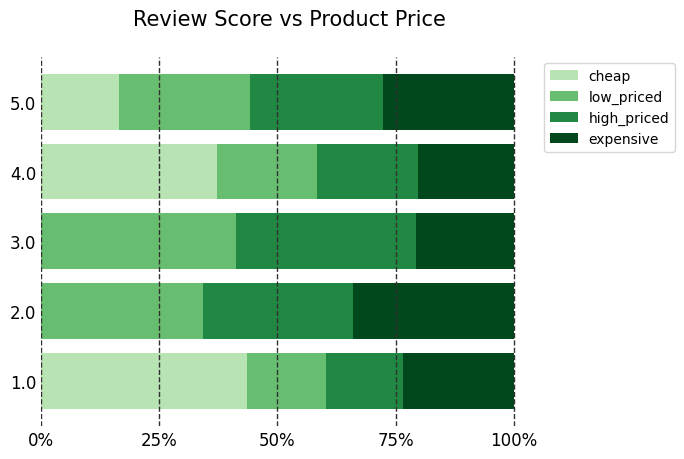

In [55]:
da.plot.bar100(
    df, 
    x="avg_products_price_cat", 
    xorder=["cheap", "low_priced", "high_priced", "expensive"],
    y="review_score", 
    yorder=[1,2,3,4,5],
    title="Review Score vs Product Price\n",
    bar_dict=dict(color=get_colors(cm.Greens, 4)))

Most 1 star products are referred to cheap products. These seemingly tend to decrease customer satisfaction as the product price could also be associated with its quality.

## 4.4 review_score vs amount of items sold per product

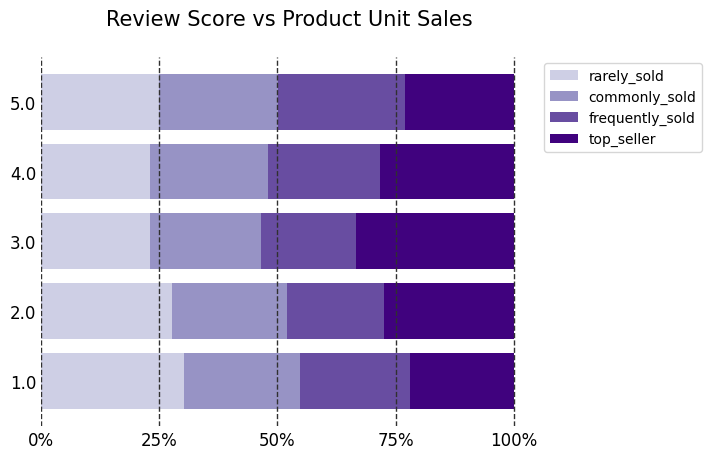

In [56]:
da.plot.bar100(
    df, 
    x="total_products_sold_cat", 
    xorder=["rarely_sold", "commonly_sold", "frequently_sold", "top_seller"],
    y="review_score", 
    yorder=[1,2,3,4,5],
    title="Review Score vs Product Unit Sales\n",
    bar_dict=dict(color=get_colors(cm.Purples, 4)))

Here the relationship is not so clear. One might have hypothesized that products with lower review scores would be purchased less often than others. Yet, this pattern isn't evident in the data. It's possible that customers are not heavily influenced by the review scores left by their peers

## 4.5 Catplot

Same information in a catplot

c:\Users\vynde\.virtualenvs\brazilian-ecommerce-olist\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


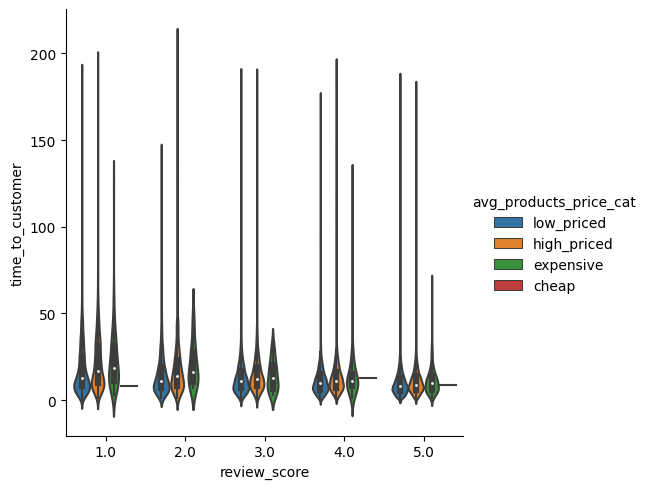

In [57]:
sns.catplot(data=df, x="review_score", y="time_to_customer", hue="avg_products_price_cat", kind="violin")

c:\Users\vynde\.virtualenvs\brazilian-ecommerce-olist\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


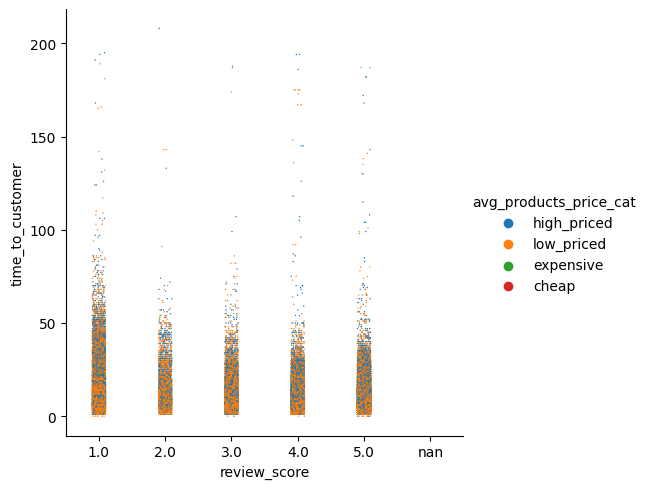

In [59]:
sns.catplot(data=df, x="review_score", y="time_to_customer", hue="avg_products_price_cat", s=1)